In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import logging

import jax
from jax import random
from jax import numpy as jnp
import wandb

from src.models import make_LIVAE_loss, make_LIVAE_eval
from src.data import get_image_dataset, NumpyLoader
from src.utils.training import setup_training, train_loop
from experiments.livae_mnist_default import get_config

In [3]:
os.environ['WANDB_NOTEBOOK_NAME'] = 'train_vae.ipynb'
# ^ W&B doesn't know how to handle VS Code notebooks.

wandb.login()

wandb: Currently logged in as: jamesallingham (invariance-learners). Use `wandb login --relogin` to force relogin


True

In [4]:
config = get_config()
rng = random.PRNGKey(config.random_seed)

In [5]:
train_dataset, test_dataset, val_dataset = get_image_dataset(
    dataset_name=config.dataset_name,
    **(config.get('dataset', {})),
)
train_loader = NumpyLoader(train_dataset, config.batch_size)
val_loader = NumpyLoader(val_dataset, config.batch_size)
test_loader = NumpyLoader(test_dataset, config.batch_size)

In [6]:
setup_rng, rng = random.split(rng)
init_data = train_dataset[0][0]

model, state = setup_training(config, setup_rng, init_data)

+-----------------------------+------------------+-----------+-----------+----------+
| Name                        | Shape            | Size      | Mean      | Std      |
+-----------------------------+------------------+-----------+-----------+----------+
| params/dec/hidden0/bias     | (256,)           | 256       | 0.0       | 0.0      |
| params/dec/hidden0/kernel   | (3, 3, 256, 256) | 589,824   | -2.62e-05 | 0.0208   |
| params/dec/hidden1/bias     | (128,)           | 128       | 0.0       | 0.0      |
| params/dec/hidden1/kernel   | (3, 3, 256, 128) | 294,912   | -5.11e-05 | 0.0209   |
| params/dec/hidden2/bias     | (64,)            | 64        | 0.0       | 0.0      |
| params/dec/hidden2/kernel   | (3, 3, 128, 64)  | 73,728    | -9.03e-05 | 0.0294   |
| params/dec/norm0/bias       | (256,)           | 256       | 0.0       | 0.0      |
| params/dec/norm0/scale      | (256,)           | 256       | 1.0       | 0.0      |
| params/dec/norm1/bias       | (128,)           | 128

  0%|          | 0/25 [00:00<?, ?it/s]

epoch:   1 - train loss: 1.56049, val_loss: 1.42749, β: 10.0, lr: 0.00014


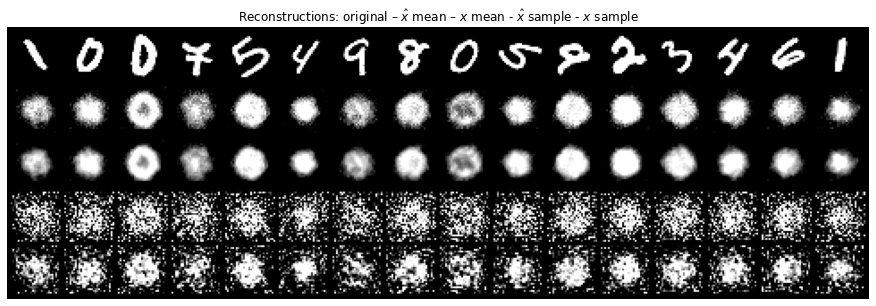

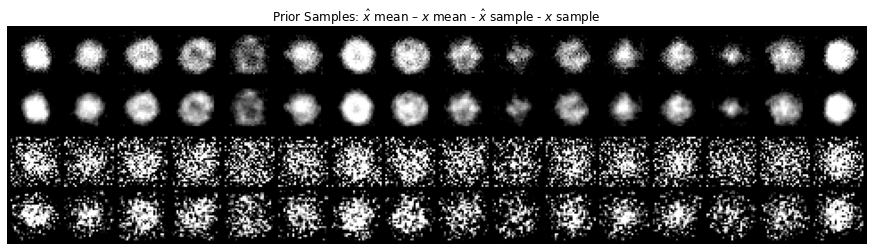

Best val_loss
epoch:   2 - train loss: 1.42127, val_loss: 1.41016, β: 9.9, lr: 0.00018


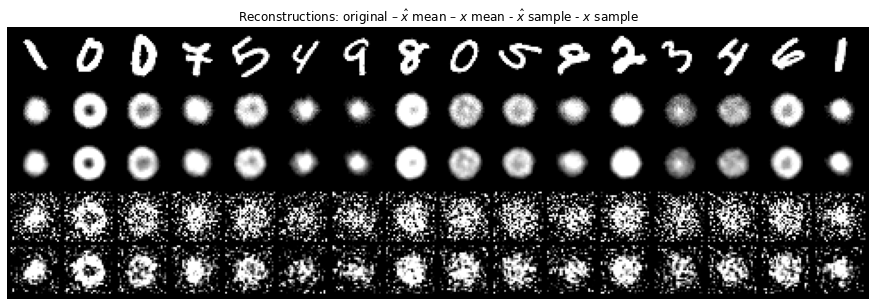

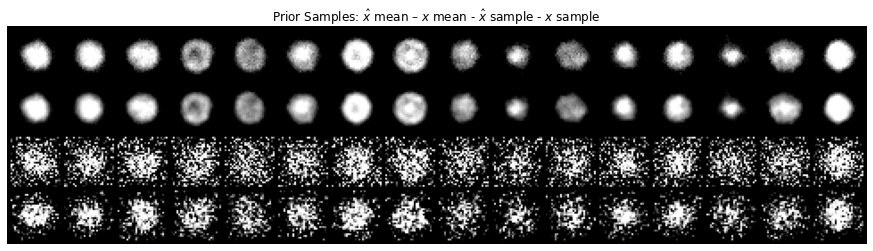

Best val_loss
epoch:   3 - train loss: 1.40555, val_loss: 1.40437, β: 9.7, lr: 0.00022


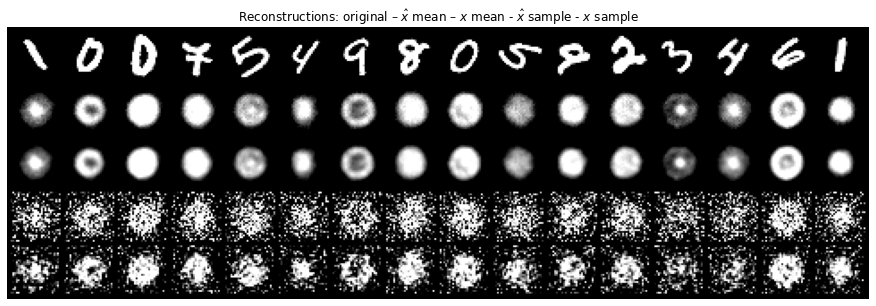

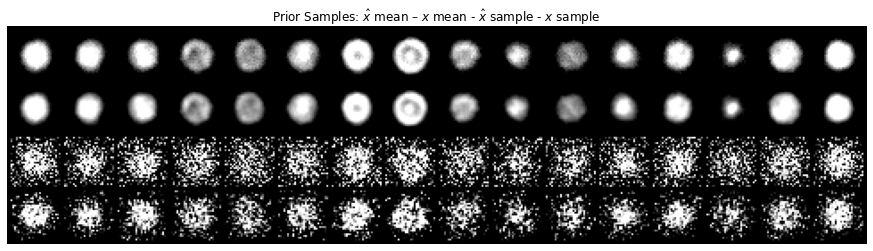

Best val_loss
epoch:   4 - train loss: 1.39289, val_loss: 1.38398, β: 9.4, lr: 0.00026


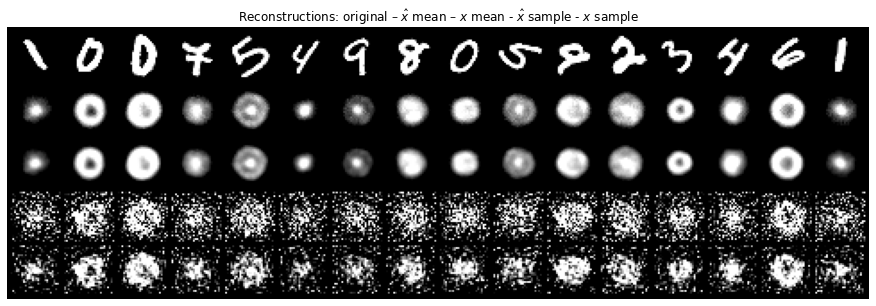

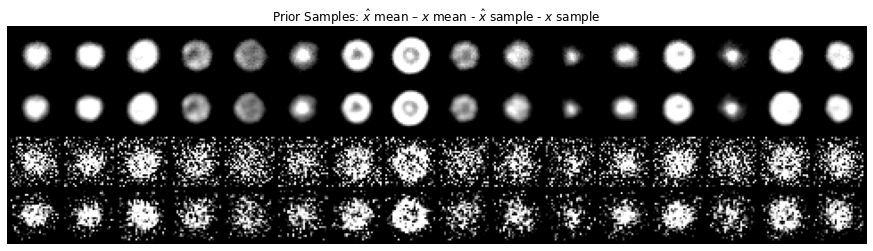

Best val_loss
epoch:   5 - train loss: 1.37992, val_loss: 1.36579, β: 9.1, lr: 0.00030


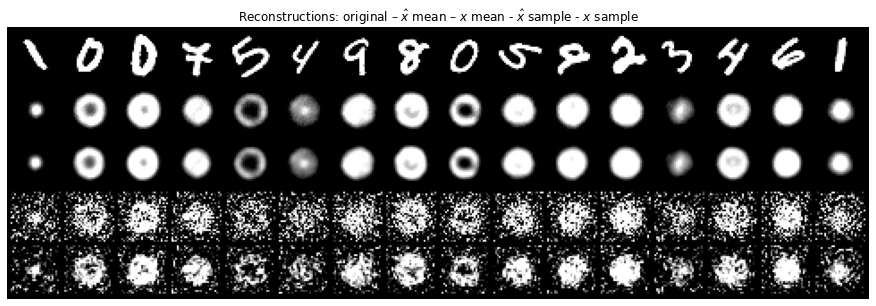

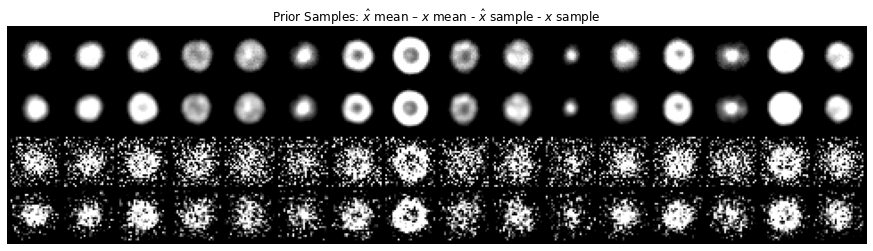

Best val_loss
epoch:   6 - train loss: 1.35962, val_loss: 1.35634, β: 8.8, lr: 0.00030


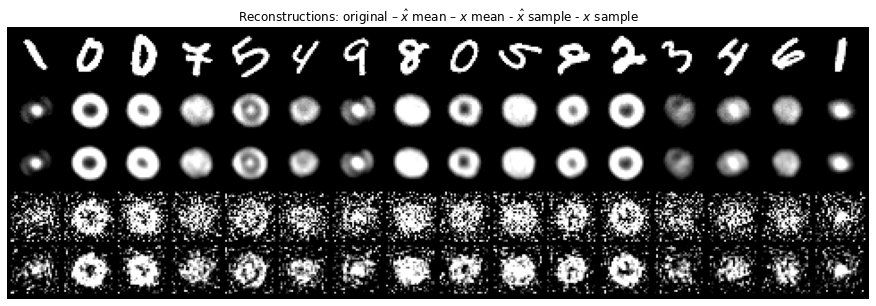

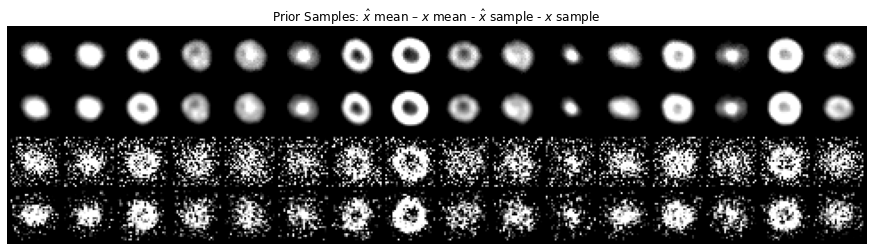

Best val_loss
epoch:   7 - train loss: 1.32751, val_loss: 1.30203, β: 8.4, lr: 0.00029


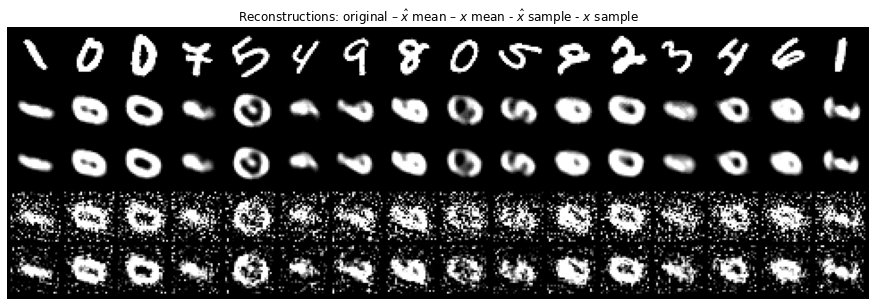

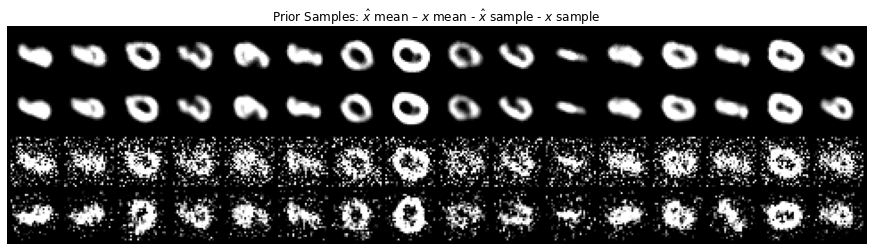

Best val_loss
epoch:   8 - train loss: 1.29365, val_loss: 1.28549, β: 7.9, lr: 0.00029


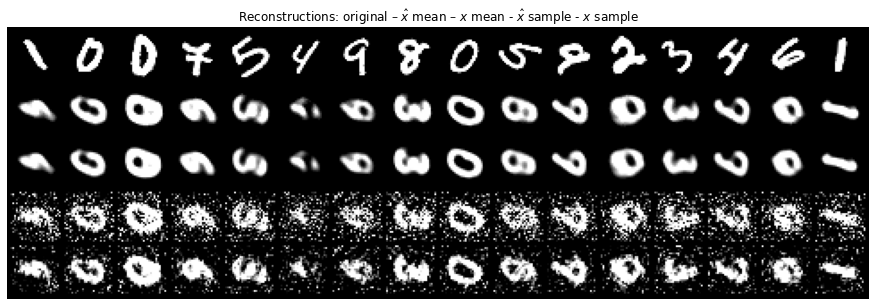

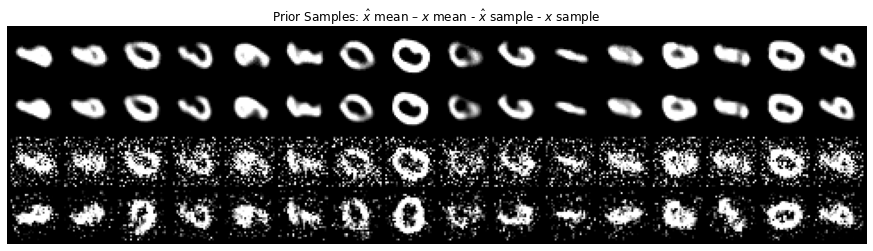

Best val_loss
epoch:   9 - train loss: 1.27453, val_loss: 1.27313, β: 7.4, lr: 0.00027


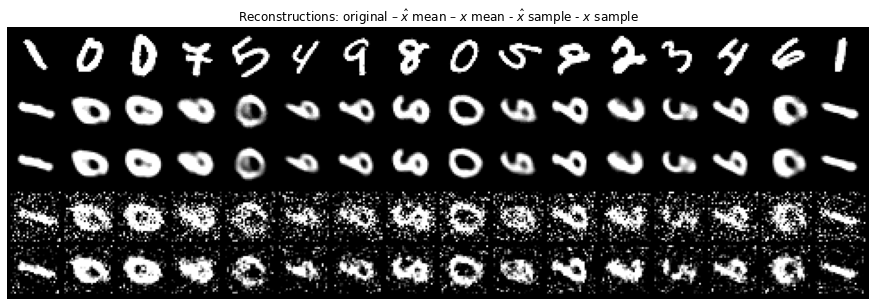

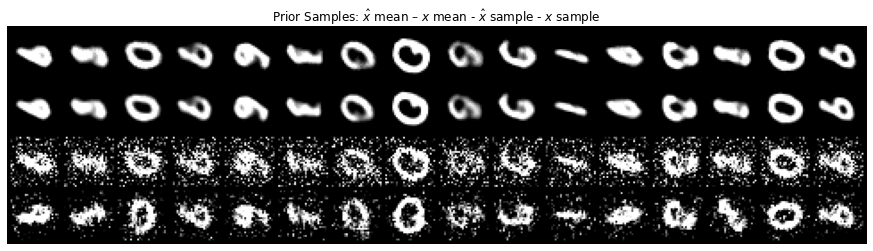

Best val_loss
epoch:  10 - train loss: 1.25765, val_loss: 1.25130, β: 6.9, lr: 0.00026


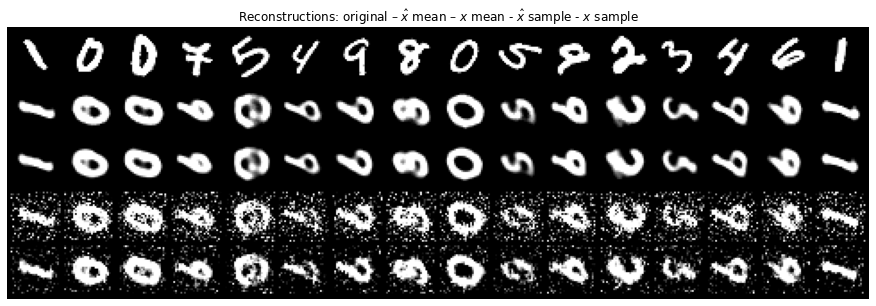

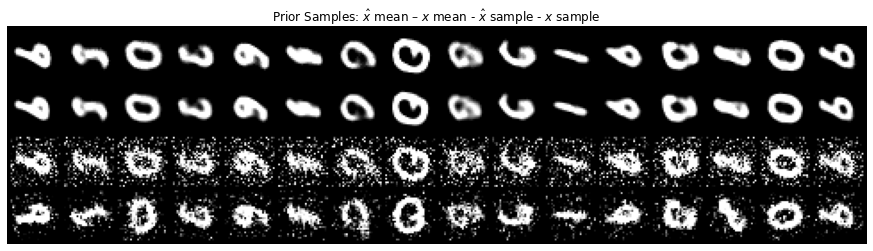

Best val_loss
epoch:  11 - train loss: 1.24312, val_loss: 1.24239, β: 6.3, lr: 0.00025


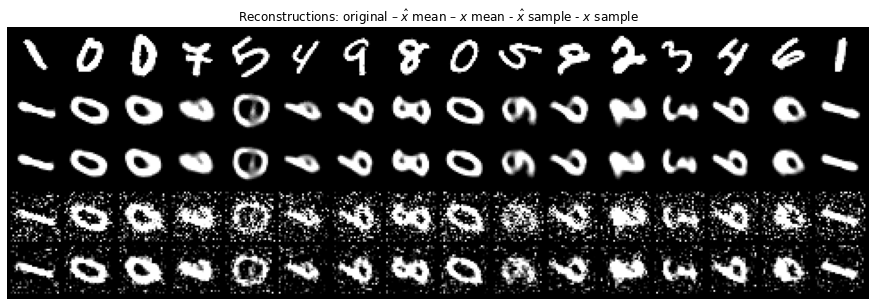

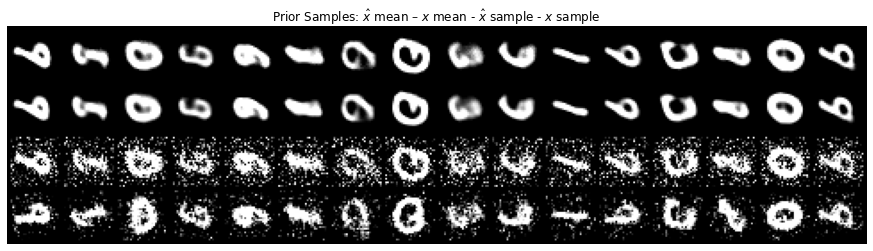

Best val_loss
epoch:  12 - train loss: 1.22801, val_loss: 1.22224, β: 5.8, lr: 0.00023


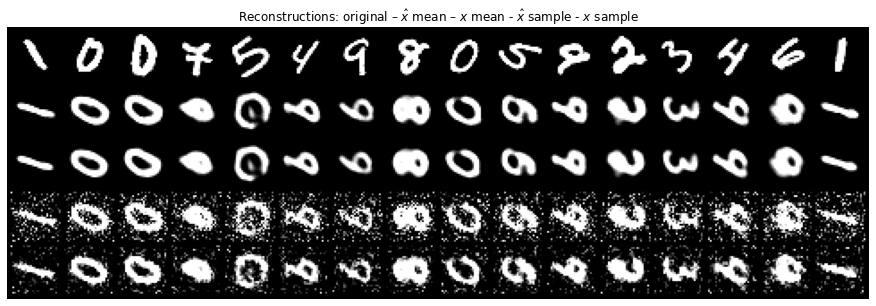

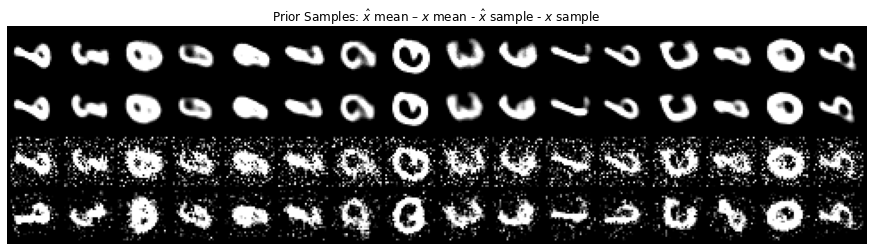

Best val_loss
epoch:  13 - train loss: 1.21237, val_loss: 1.20613, β: 5.2, lr: 0.00021


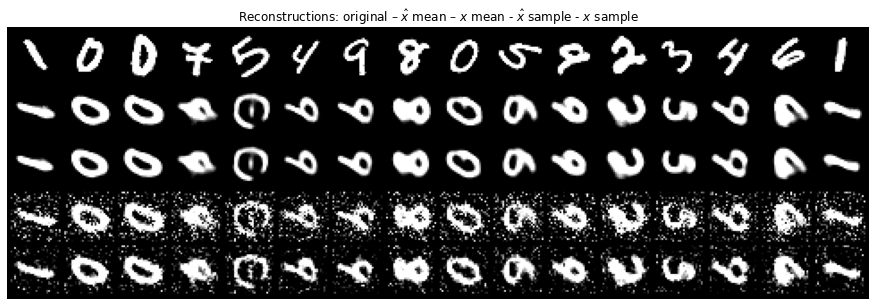

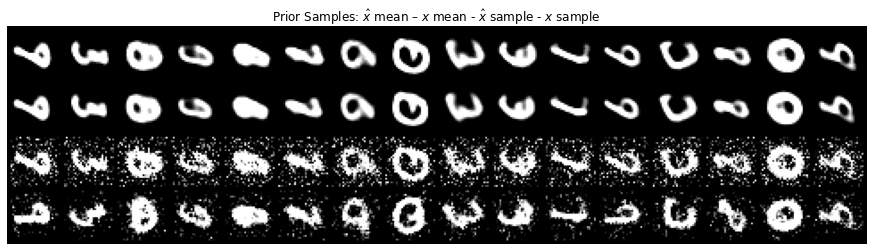

Best val_loss
epoch:  14 - train loss: 1.19939, val_loss: 1.19779, β: 4.7, lr: 0.00019


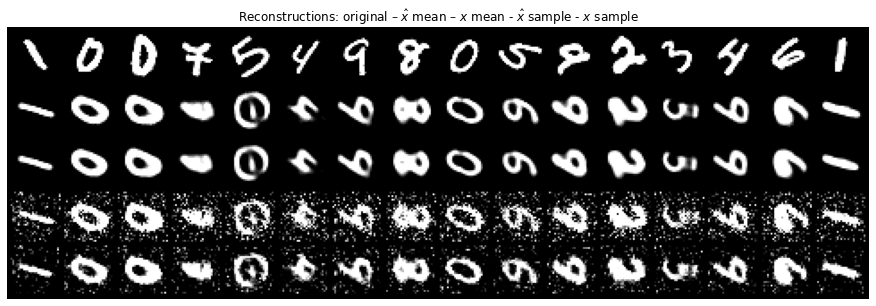

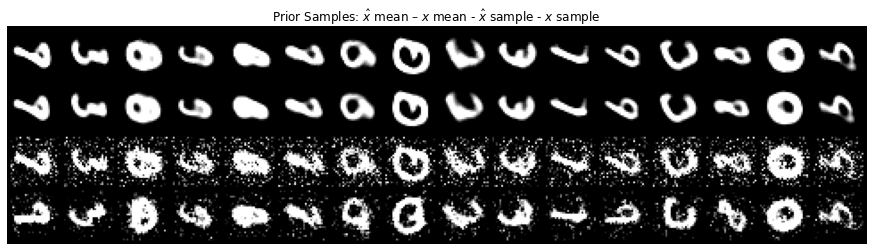

Best val_loss
epoch:  15 - train loss: 1.18752, val_loss: 1.18170, β: 4.1, lr: 0.00017


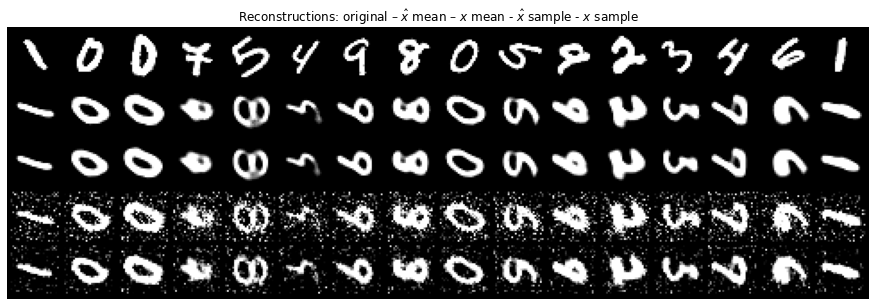

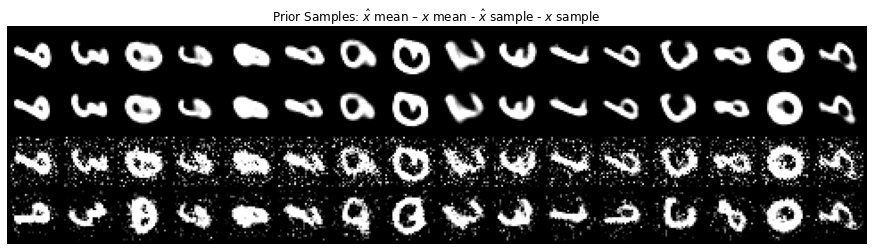

Best val_loss
epoch:  16 - train loss: 1.17456, val_loss: 1.16993, β: 3.6, lr: 0.00015


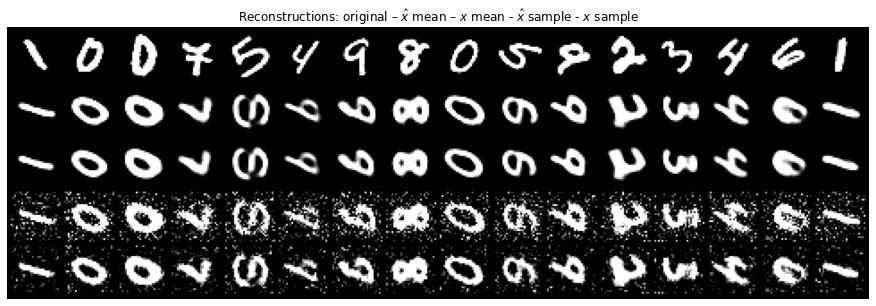

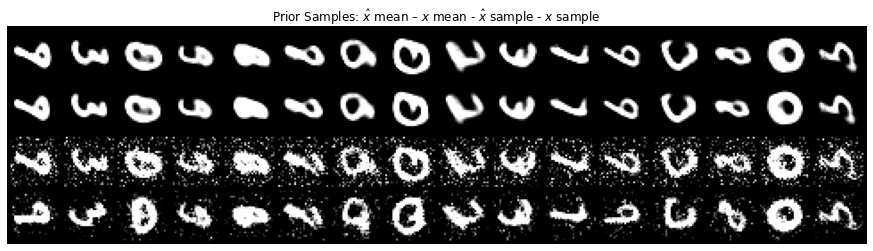

Best val_loss
epoch:  17 - train loss: 1.16289, val_loss: 1.15934, β: 3.1, lr: 0.00013


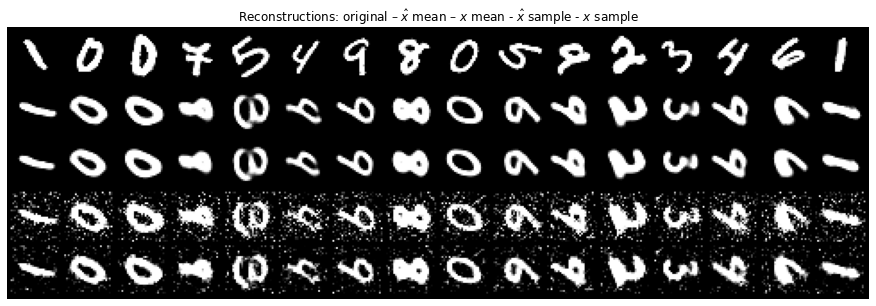

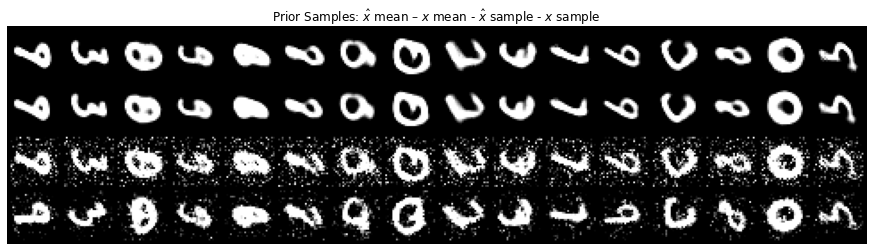

Best val_loss
epoch:  18 - train loss: 1.15152, val_loss: 1.14767, β: 2.6, lr: 0.00011


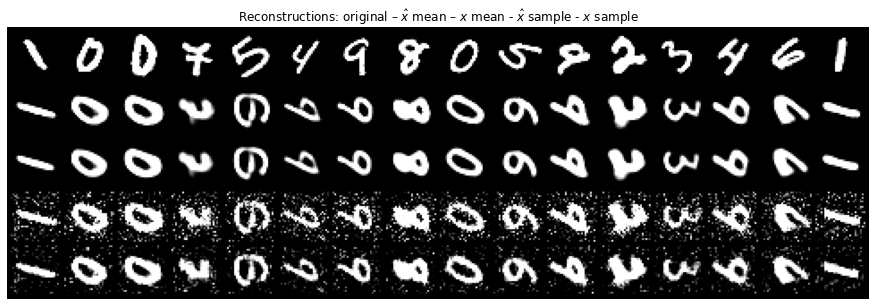

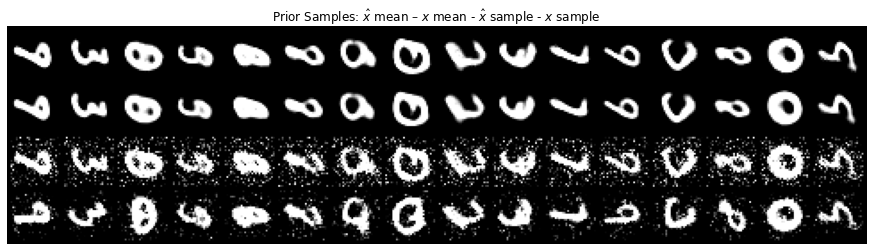

Best val_loss
epoch:  19 - train loss: 1.14041, val_loss: 1.13868, β: 2.2, lr: 0.00009


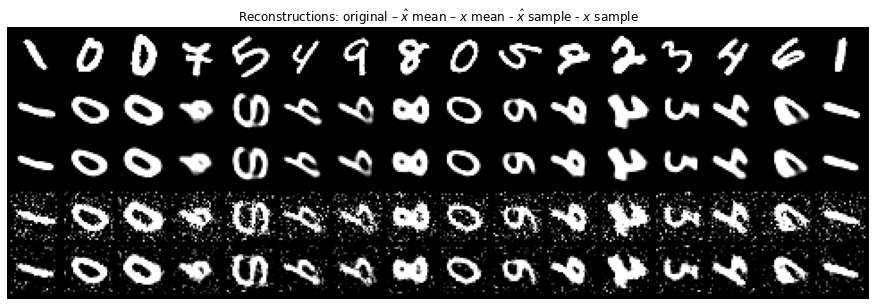

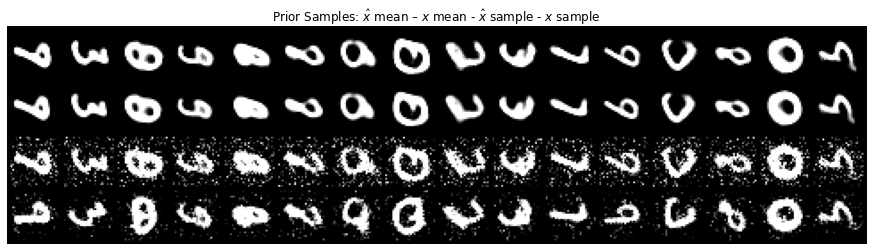

Best val_loss
epoch:  20 - train loss: 1.13037, val_loss: 1.12696, β: 1.9, lr: 0.00007


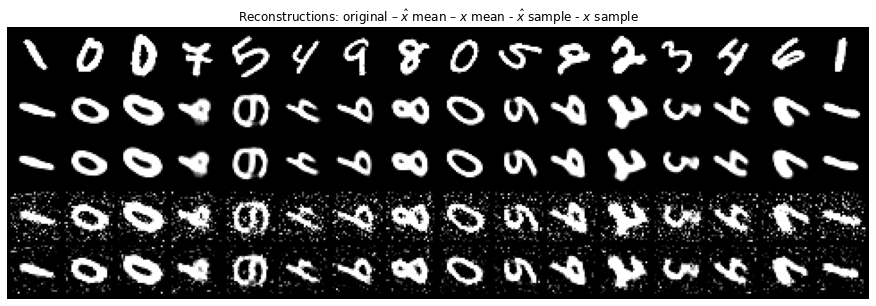

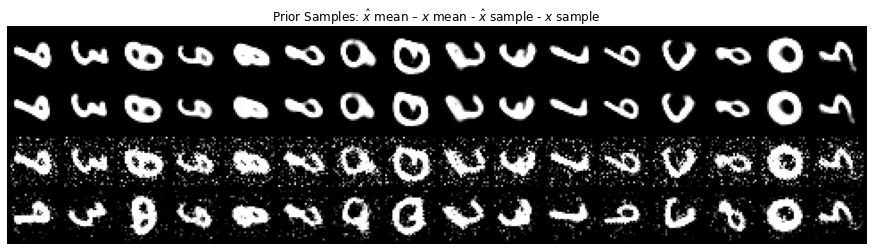

Best val_loss
epoch:  21 - train loss: 1.12081, val_loss: 1.11925, β: 1.6, lr: 0.00006


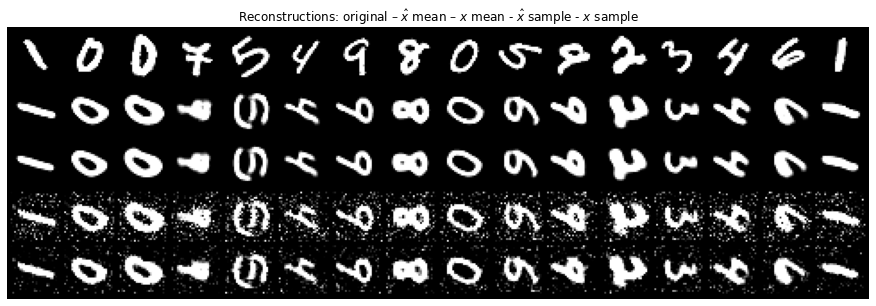

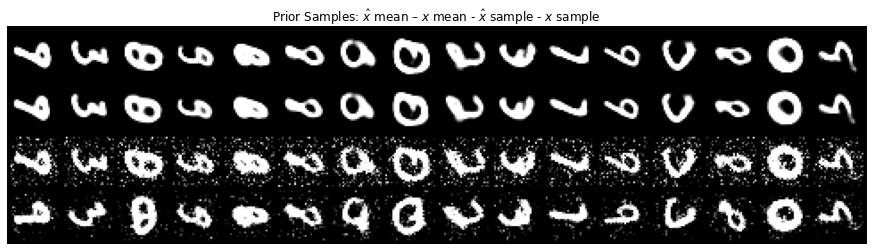

Best val_loss
epoch:  22 - train loss: 1.11219, val_loss: 1.11071, β: 1.3, lr: 0.00005


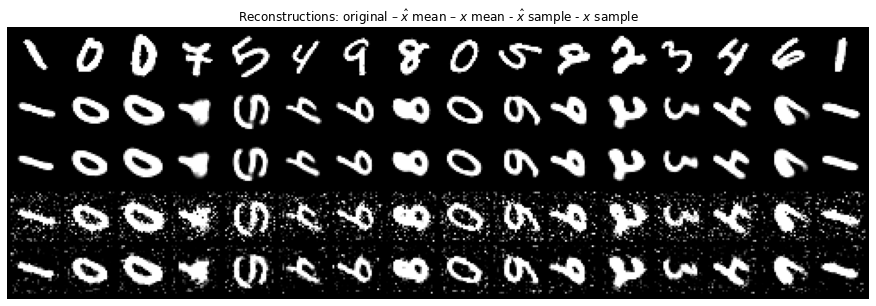

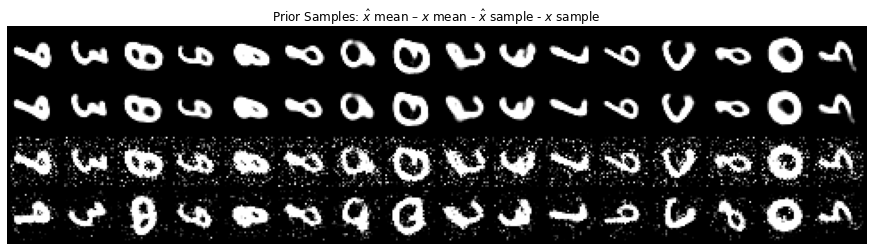

Best val_loss
epoch:  23 - train loss: 1.10523, val_loss: 1.10463, β: 1.1, lr: 0.00004


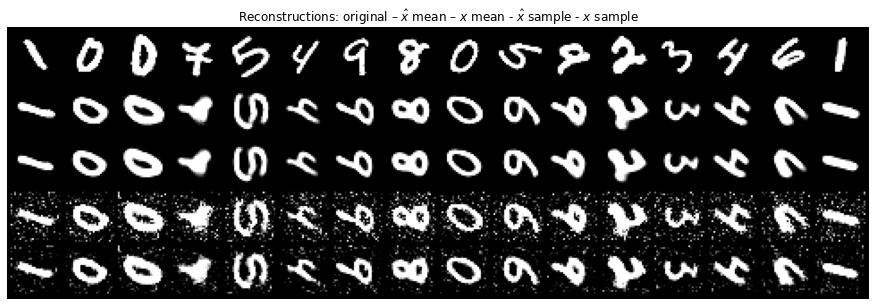

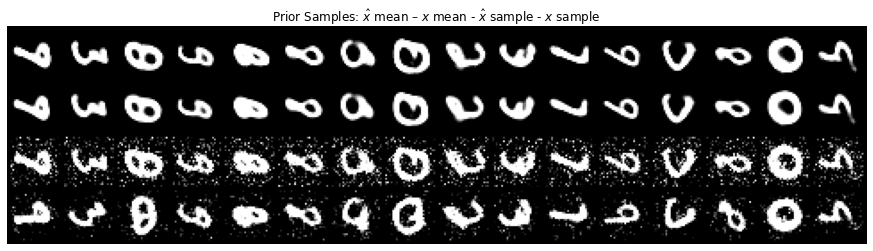

Best val_loss
epoch:  24 - train loss: 1.09985, val_loss: 1.10029, β: 1.0, lr: 0.00003


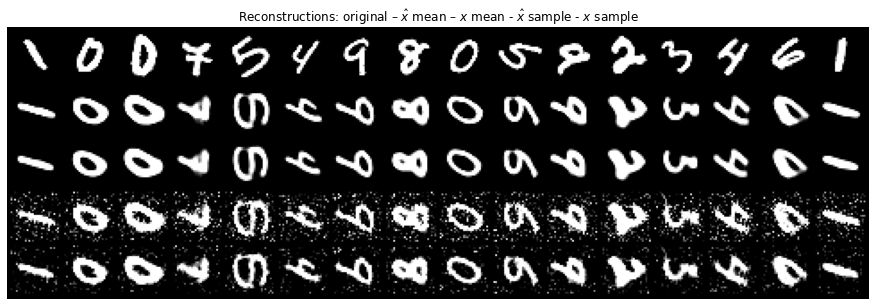

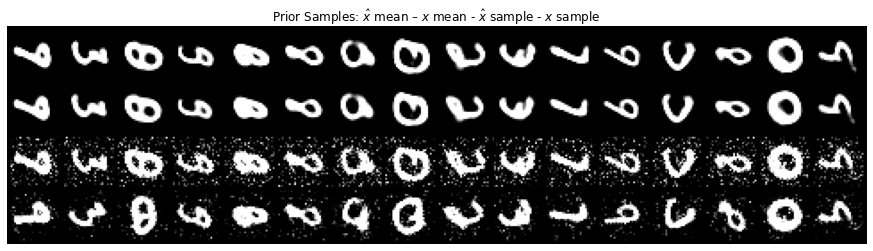

Best val_loss
epoch:  25 - train loss: 1.09630, val_loss: 1.09832, β: 1.0, lr: 0.00003


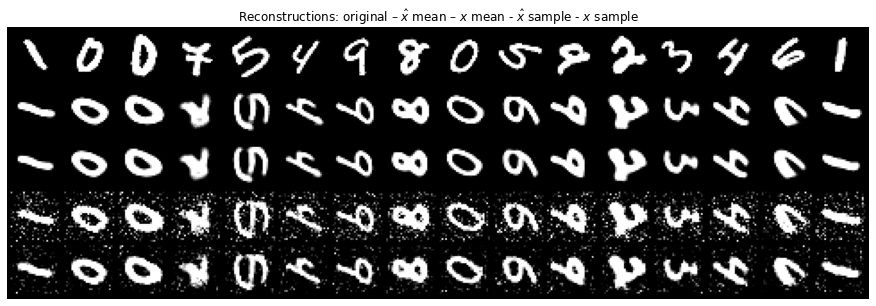

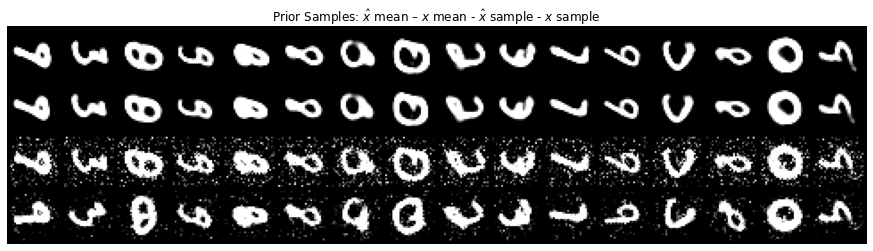

Best val_loss


epoch,▁▁▂▂▂▂▃▃▃▄▄▄▅▅▅▅▆▆▆▇▇▇▇██
learning_rate,▄▅▆▇████▇▇▇▆▆▅▅▄▃▃▂▂▂▁▁▁▁
train/elbo,▁▃▃▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇█████
train/elbo_unnorm,▁▃▃▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇█████
train/kld,▃▁▁▁▁▁▁▂▂▂▂▃▃▃▃▄▄▄▅▅▆▇▇██
train/ll,▁▂▂▃▃▃▄▅▅▅▆▆▆▆▇▇▇▇▇██████
train/loss,█▆▆▅▅▅▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁
train/η_kld,█▆▄▄▅▁▂▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃
val/elbo,▁▁▁▂▂▃▄▄▄▅▅▅▆▆▆▆▇▇▇▇█████
val/elbo_unnorm,▁▁▁▂▂▃▄▄▄▅▅▅▆▆▆▆▇▇▇▇█████
val/kld,▁▁▁▁▁▁▂▂▂▂▂▃▃▃▃▄▄▅▅▆▆▇▇██


μ, σ = 0.0, 65.7


In [7]:
state = train_loop(
    model, state, config, rng, make_LIVAE_loss, make_LIVAE_eval, train_loader, val_loader,
    # test_loader,
    wandb_kwargs={
        'mode': 'offline',
        # 'notes': '',
        # 'tags': ['livae_testing', 'η_prior_testing', 'uniform_prior', 'invariance full'],
    },
)

μ = state.params['η_prior_μ'][2] * 180 / jnp.pi
σ = jax.nn.softplus(state.params['η_prior_σ_'][2]) * 180 / jnp.pi
print(f'μ, σ = {μ:.1f}, {σ:.1f}')


In [8]:
print(state.params['η_prior_μ'])
print(state.params['η_prior_σ_'])

[0. 0. 0. 0. 0. 0. 0.]
[0.5413248 0.5413248 0.7637481 0.5413248 0.5413248 0.5413248 0.5413248]


TODO: log mean and std of learnt prior